# 🧠 RQNN + Classical Filter Comparison on Multi-Sensor Fusion Data

This notebook applies **every filter** — classical and RQNN — to **every sensor**
from the Husarion Lynx UGV rosbag data, then produces side-by-side comparison plots.

## Filters Applied
| # | Filter | Type |
|---|--------|------|
| 1 | Low-Pass (Butterworth, Nyquist-aware) | Classical |
| 2 | Moving Average (scaled to fs) | Classical |
| 3 | Savitzky-Golay (scaled to fs) | Classical |
| 4 | Median (scaled to fs) | Classical |
| 5 | RQNN (default params) | Quantum Neural Network |
| 6 | RQNN (PSO-tuned) | Quantum Neural Network |

## Sensors
- **IMU**: ax, ay, az, gx, gy, gz
- **Wheel Odometry**: vx, wz
- **Visual Odometry**: vx, wz
- **LiDAR Odometry**: vx, wz
- **EKF Filtered**: vx, wz


In [1]:
import sys, os, warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, savgol_filter, medfilt, welch
from scipy.ndimage import uniform_filter1d
from scipy.fft import rfft, rfftfreq

# Add project root so we can import qnn_eeg_filtering
sys.path.insert(0, '/home/anish/Multi-sensor-fusion')
from qnn_eeg_filtering import RQNNFilter, PSOOptimizer

plt.rcParams['figure.dpi'] = 120
plt.rcParams['font.size'] = 10
print("✅ All imports successful")


✅ All imports successful


In [2]:
# ============================================================
# Load rosbag data
# ============================================================
import rosbag2_py
from rclpy.serialization import deserialize_message
from sensor_msgs.msg import Imu
from nav_msgs.msg import Odometry
from sensor_msgs.msg import NavSatFix

BAG_PATH = '/home/rosdata/rosbags/moving_bot_data_20260410_214010'

storage_options = rosbag2_py.StorageOptions(uri=BAG_PATH, storage_id='sqlite3')
converter_options = rosbag2_py.ConverterOptions(
    input_serialization_format='cdr', output_serialization_format='cdr')
reader = rosbag2_py.SequentialReader()
reader.open(storage_options, converter_options)

topic_type_map = {}
for t in reader.get_all_topics_and_types():
    topic_type_map[t.name] = t.type

TOPIC_MAP = {
    '/imu/data': ('imu', Imu),
    '/diff_drive_controller/odom': ('wheel_odom', Odometry),
    '/odometry/visual': ('visual_odom', Odometry),
    '/odometry/lidar': ('lidar_odom', Odometry),
    '/odometry/filtered': ('ekf', Odometry),
    '/gps/fix': ('gps', NavSatFix),
}

raw = {k: [] for k in ['imu', 'wheel_odom', 'visual_odom', 'lidar_odom', 'ekf', 'gps']}

while reader.has_next():
    topic, data, timestamp = reader.read_next()
    if topic not in TOPIC_MAP:
        continue
    name, msg_type = TOPIC_MAP[topic]
    msg = deserialize_message(data, msg_type)
    t_sec = timestamp * 1e-9

    if msg_type == Imu:
        raw[name].append(dict(
            time=t_sec,
            ax=msg.linear_acceleration.x, ay=msg.linear_acceleration.y, az=msg.linear_acceleration.z,
            gx=msg.angular_velocity.x, gy=msg.angular_velocity.y, gz=msg.angular_velocity.z))
    elif msg_type == Odometry:
        raw[name].append(dict(
            time=t_sec,
            vx=msg.twist.twist.linear.x, vy=msg.twist.twist.linear.y,
            wz=msg.twist.twist.angular.z))
    elif msg_type == NavSatFix:
        raw[name].append(dict(time=t_sec, lat=msg.latitude, lon=msg.longitude, alt=msg.altitude))

dfs = {}
for name, rows in raw.items():
    if rows:
        df = pd.DataFrame(rows)
        df['time'] -= df['time'].iloc[0]
        dfs[name] = df

print("✅ Data loaded successfully")
for name, df in dfs.items():
    print(f"  {name:20s}: {len(df):6d} samples")


[INFO] [1775838646.377602947] [rosbag2_storage]: Opened database '/home/rosdata/rosbags/moving_bot_data_20260410_214010/moving_bot_data_20260410_214010_0.db3' for READ_ONLY.


✅ Data loaded successfully
  imu                 :  16842 samples
  wheel_odom          :   4206 samples
  visual_odom         :   1564 samples
  lidar_odom          :    421 samples
  gps                 :    842 samples


In [3]:
# ============================================================
# Compute actual sampling rates for each sensor
# ============================================================
sensor_fs = {}
for name, df in dfs.items():
    if len(df) > 1:
        dt = np.mean(np.diff(df['time'].values))
        fs = 1.0 / dt if dt > 0 else 100.0
        sensor_fs[name] = fs
        print(f"  {name:20s}: fs = {fs:.1f} Hz  (dt = {dt*1000:.1f} ms)")


  imu                 : fs = 154.4 Hz  (dt = 6.5 ms)
  wheel_odom          : fs = 38.6 Hz  (dt = 25.9 ms)
  visual_odom         : fs = 14.3 Hz  (dt = 69.7 ms)
  lidar_odom          : fs = 3.9 Hz  (dt = 259.1 ms)
  gps                 : fs = 7.7 Hz  (dt = 129.5 ms)


In [4]:
# ============================================================
# Nyquist-aware filter functions (scaled to actual sampling rate)
# ============================================================

def apply_lowpass(signal, fs, cutoff_ratio=0.45, order=4):
    """Butterworth lowpass with Nyquist-aware cutoff."""
    cutoff = min(fs * cutoff_ratio, fs * 0.49)  # stay < Nyquist
    b, a = butter(order, cutoff / (fs / 2), btype='low')
    return filtfilt(b, a, signal), f"Low-Pass ({cutoff:.0f}Hz)"

def apply_moving_avg(signal, fs, window_sec=0.15):
    """Moving average with window scaled to sampling rate."""
    w = max(3, int(fs * window_sec) | 1)
    return uniform_filter1d(signal, size=w), f"Moving Avg (w={w})"

def apply_savgol(signal, fs, window_sec=0.15, order=3):
    """Savitzky-Golay filter with window scaled to sampling rate."""
    w = max(order + 2, int(fs * window_sec) | 1)
    return savgol_filter(signal, w, order), f"Savitzky-Golay (w={w})"

def apply_median(signal, fs, window_sec=0.15):
    """Median filter with window scaled to sampling rate."""
    w = max(3, int(fs * window_sec) | 1)
    return medfilt(signal, kernel_size=w), f"Median (k={w})"

def apply_rqnn_default(signal, fs):
    """RQNN filter with default parameters."""
    margin = 2.0 * np.std(signal)
    rqnn = RQNNFilter(
        n_lattice=150,
        x_range=(float(signal.min() - margin), float(signal.max() + margin)),
        dt=1.0 / fs,
    )
    filtered = rqnn.filter_signal(signal, n_substeps=2)
    return filtered, "★ RQNN (default)"

def apply_rqnn_pso(signal, fs, n_particles=15, n_iterations=20):
    """RQNN filter with PSO-tuned hyperparameters."""
    margin = 2.0 * np.std(signal)
    base_kw = dict(
        n_lattice=150,
        x_range=(float(signal.min() - margin), float(signal.max() + margin)),
        dt=1.0 / fs,
    )
    # Optimize on first half of signal for speed
    seg_len = max(50, len(signal) // 2)
    pso = PSOOptimizer(n_particles=n_particles, n_iterations=n_iterations, seed=42)
    
    # Use the signal itself as "clean" reference for optimization
    # (the optimizer will minimize reconstruction error)
    best = pso.optimize(signal[:seg_len], signal[:seg_len], base_rqnn_kwargs=base_kw, verbose=False)
    
    kw_opt = dict(base_kw)
    kw_opt.update(best)
    rqnn = RQNNFilter(**kw_opt)
    filtered = rqnn.filter_signal(signal, n_substeps=2)
    return filtered, "★ RQNN (PSO-tuned)"

print("✅ Filter functions defined")


✅ Filter functions defined


## 📊 IMU Sensor Analysis (All Filters)

Applying all 6 filters to every IMU channel (ax, ay, az, gx, gy, gz) and plotting comparisons.



  Processing IMU channel: Accel X (m/s²) (2000 samples, fs=154.4 Hz)
  ✅ Low-Pass (69Hz)
  ✅ Moving Avg (w=23)
  ✅ Savitzky-Golay (w=23)
  ✅ Median (k=23)
  ✅ ★ RQNN (default)
  ✅ ★ RQNN (PSO-tuned)


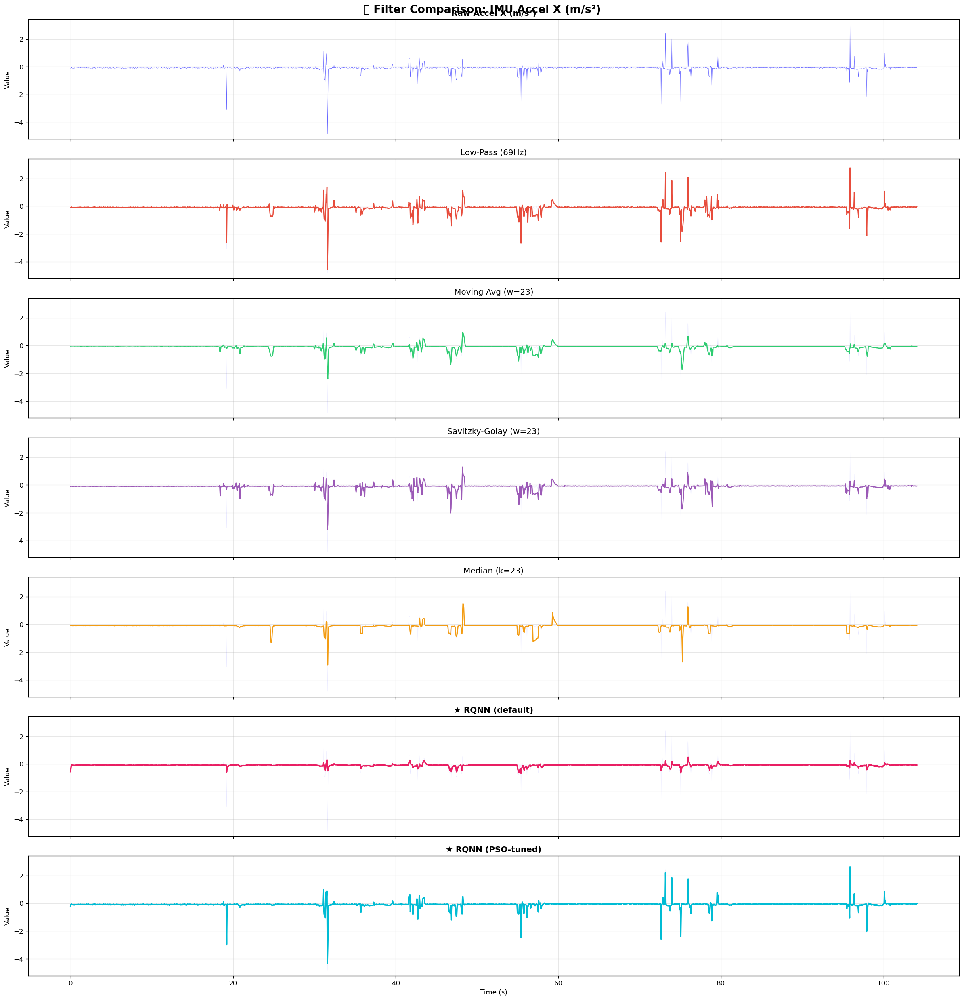

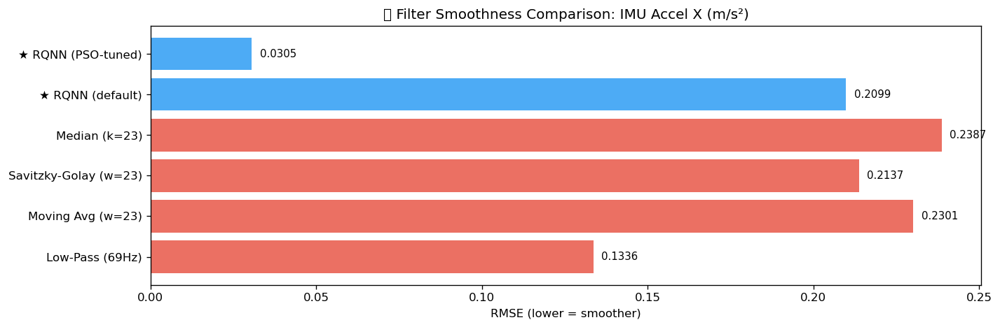


  Processing IMU channel: Accel Y (m/s²) (2000 samples, fs=154.4 Hz)
  ✅ Low-Pass (69Hz)
  ✅ Moving Avg (w=23)
  ✅ Savitzky-Golay (w=23)
  ✅ Median (k=23)
  ✅ ★ RQNN (default)
  ✅ ★ RQNN (PSO-tuned)


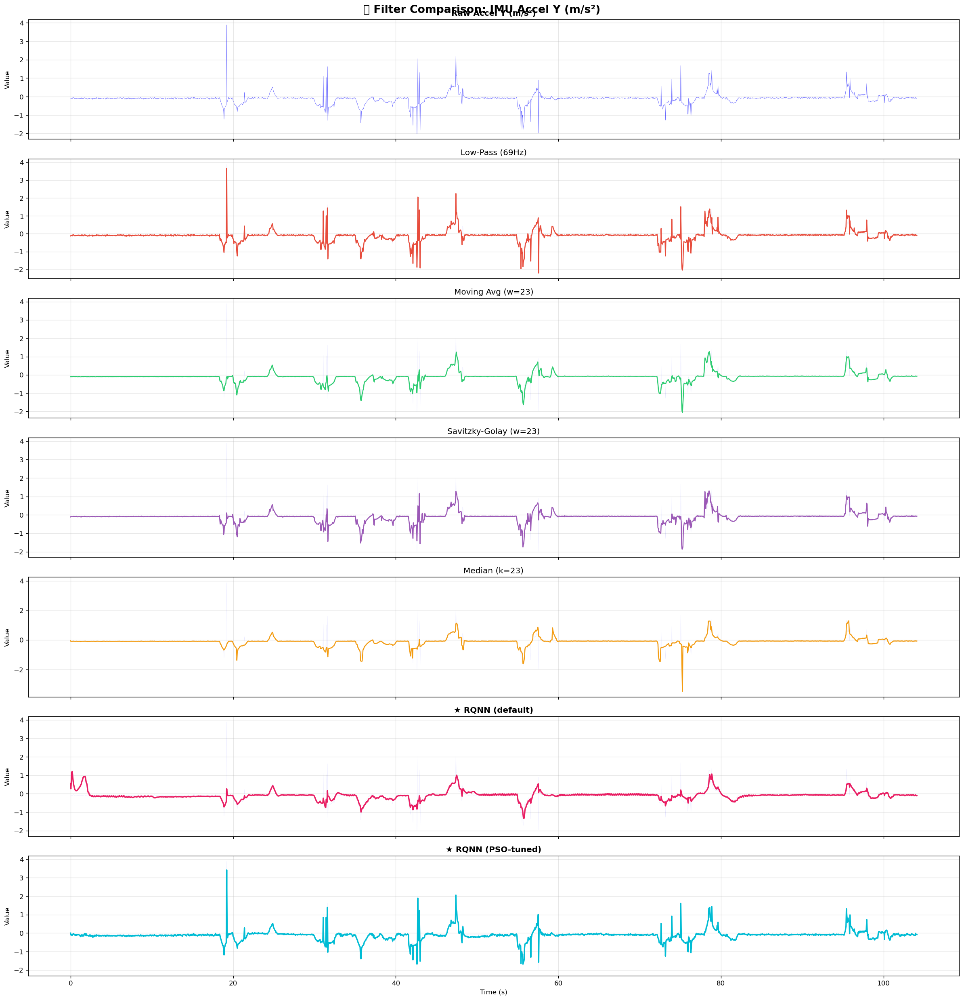

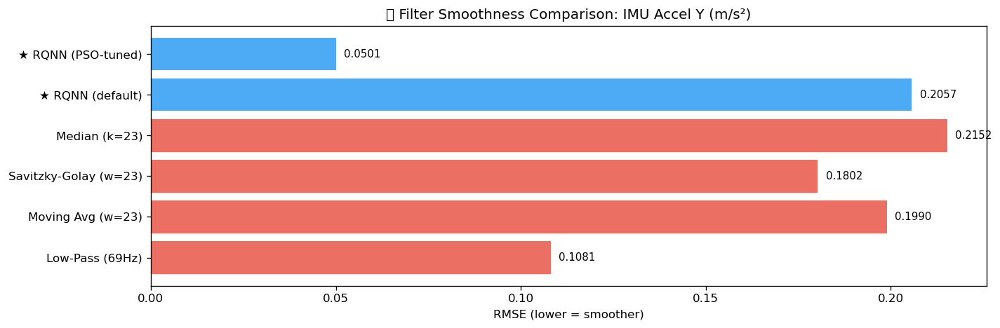


  Processing IMU channel: Accel Z (m/s²) (2000 samples, fs=154.4 Hz)
  ✅ Low-Pass (69Hz)
  ✅ Moving Avg (w=23)
  ✅ Savitzky-Golay (w=23)
  ✅ Median (k=23)
  ✅ ★ RQNN (default)
  ✅ ★ RQNN (PSO-tuned)


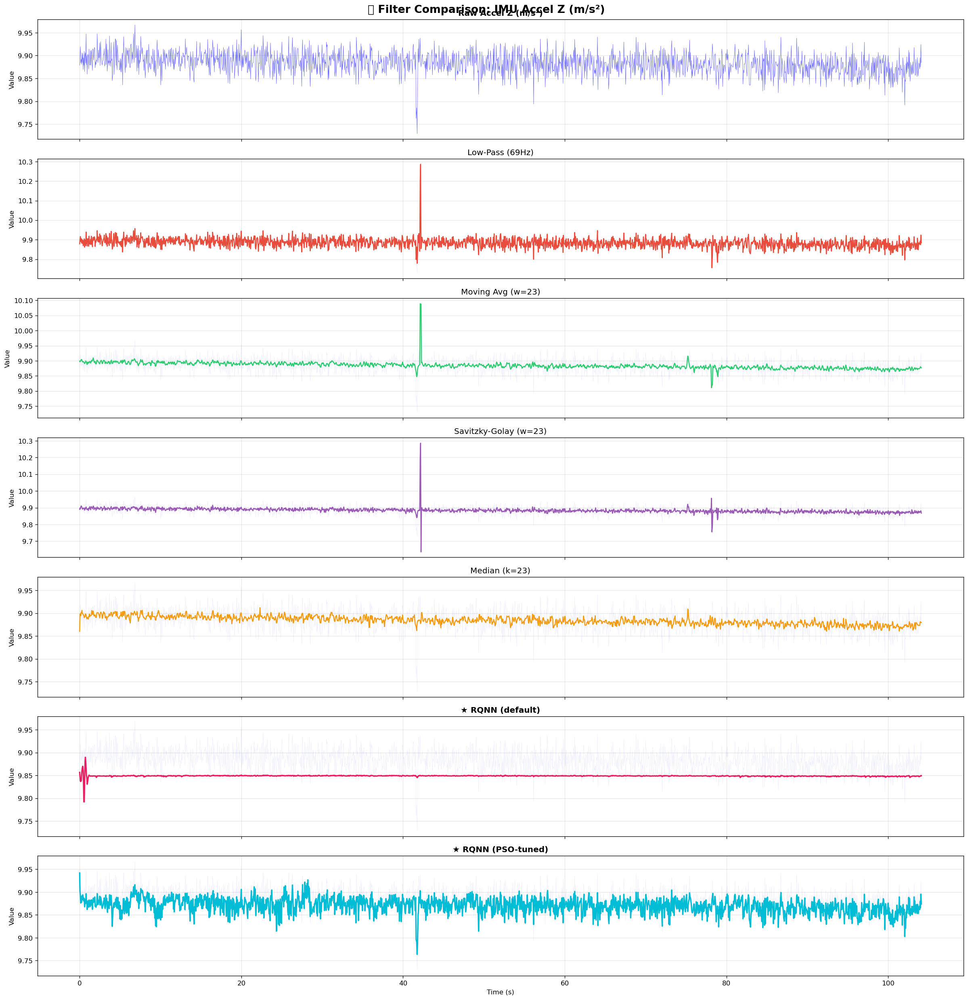

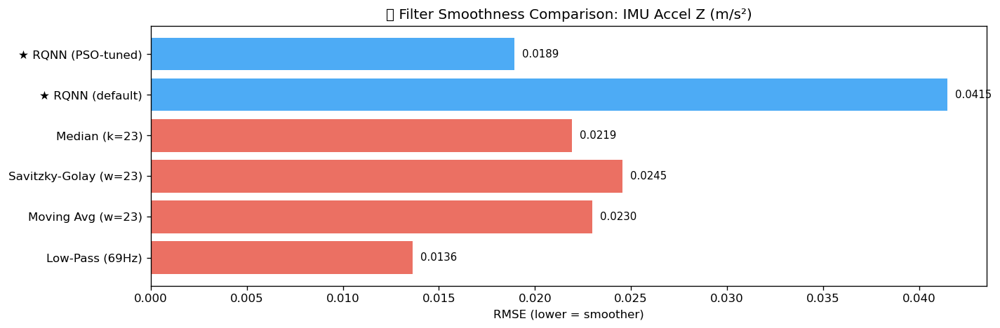


  Processing IMU channel: Gyro X (rad/s) (2000 samples, fs=154.4 Hz)
  ✅ Low-Pass (69Hz)
  ✅ Moving Avg (w=23)
  ✅ Savitzky-Golay (w=23)
  ✅ Median (k=23)
  ✅ ★ RQNN (default)
  ✅ ★ RQNN (PSO-tuned)


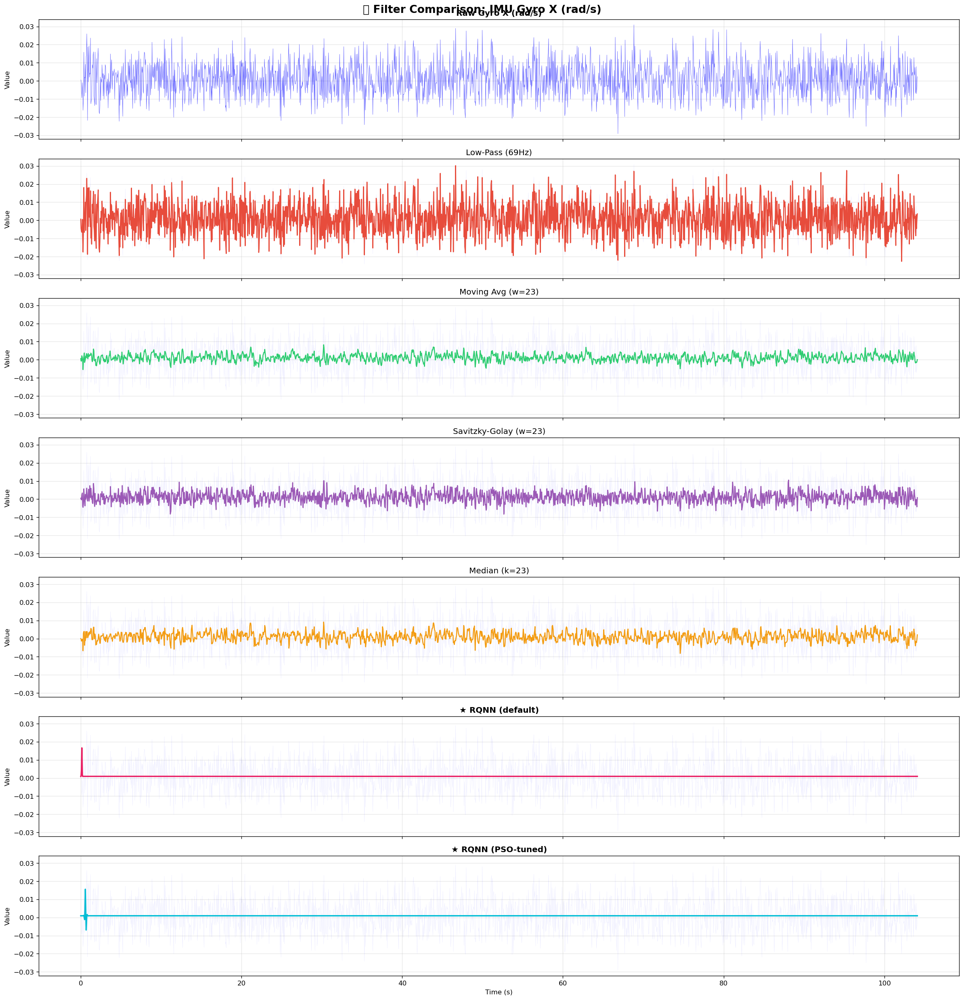

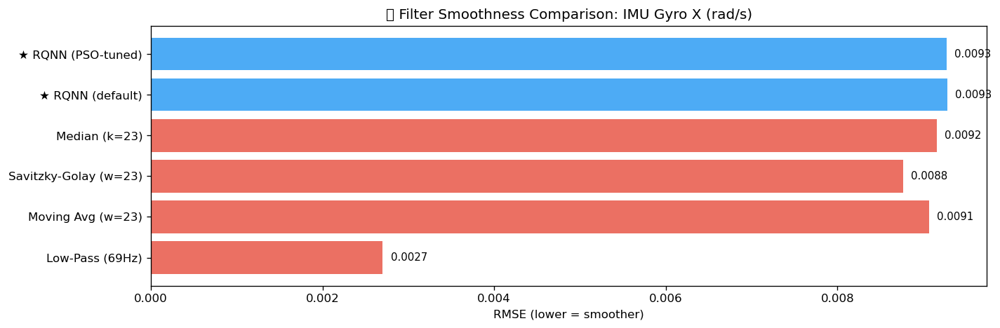


  Processing IMU channel: Gyro Y (rad/s) (2000 samples, fs=154.4 Hz)
  ✅ Low-Pass (69Hz)
  ✅ Moving Avg (w=23)
  ✅ Savitzky-Golay (w=23)
  ✅ Median (k=23)
  ✅ ★ RQNN (default)
  ✅ ★ RQNN (PSO-tuned)


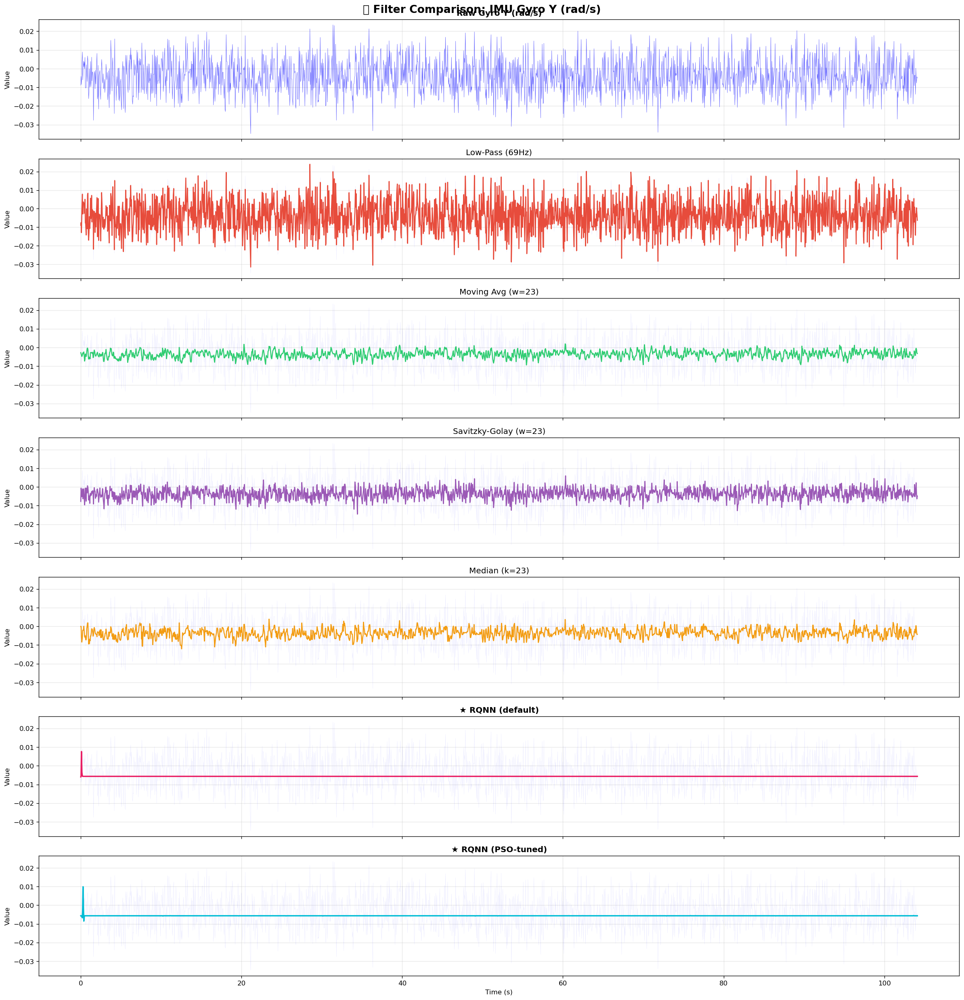

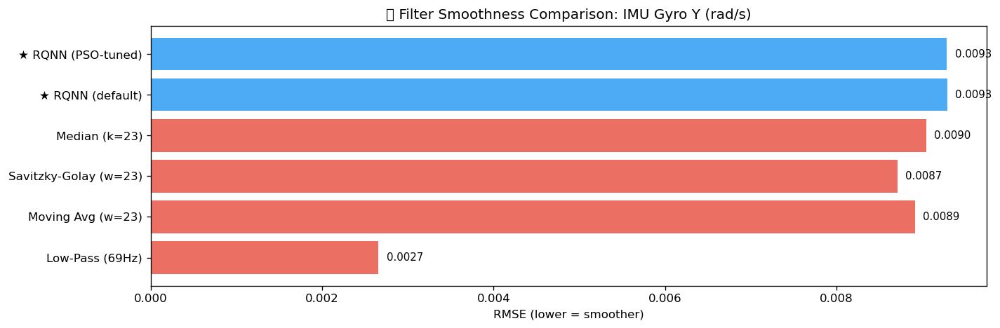


  Processing IMU channel: Gyro Z (rad/s) (2000 samples, fs=154.4 Hz)
  ✅ Low-Pass (69Hz)
  ✅ Moving Avg (w=23)
  ✅ Savitzky-Golay (w=23)
  ✅ Median (k=23)
  ✅ ★ RQNN (default)
  ✅ ★ RQNN (PSO-tuned)


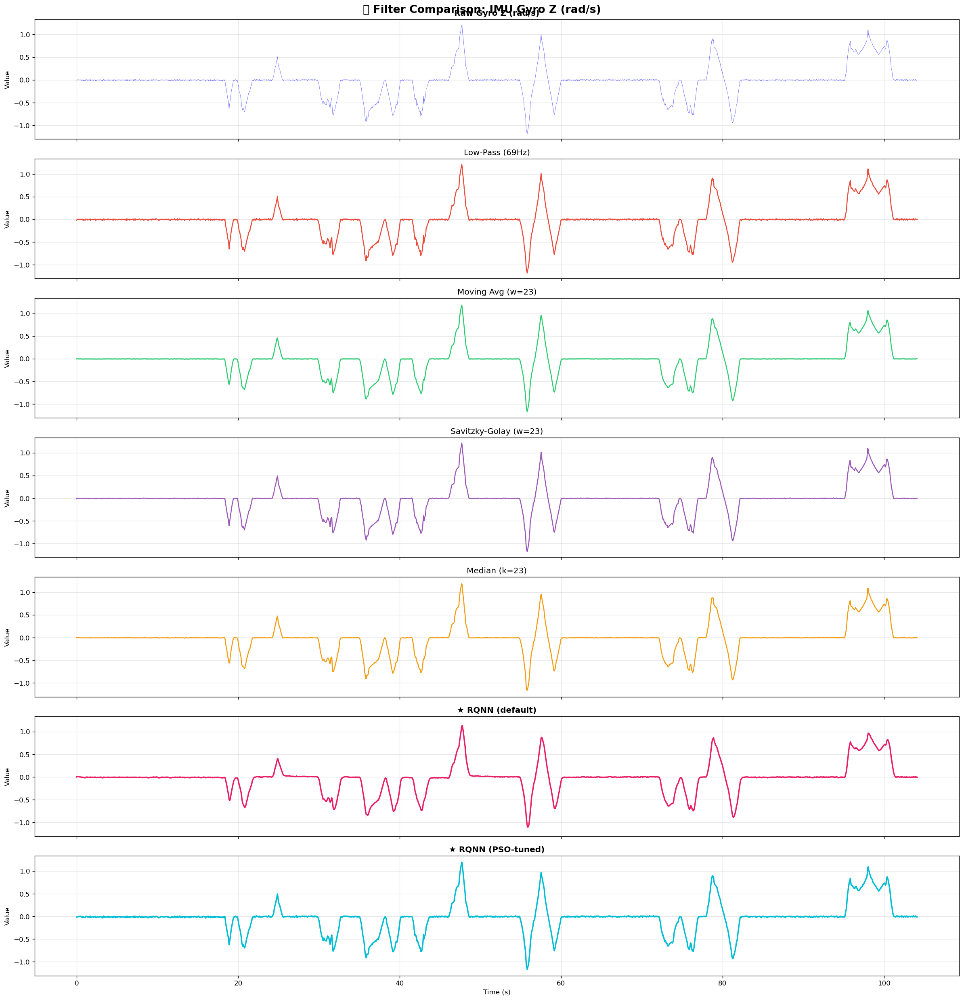

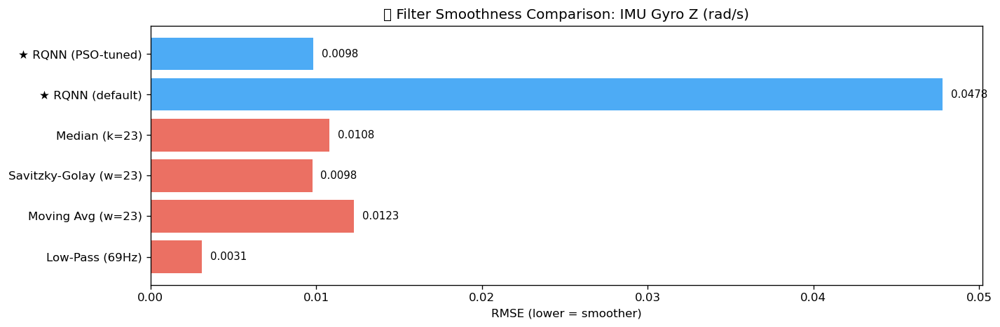

In [5]:
# ============================================================
# Apply ALL filters to IMU data
# ============================================================
if 'imu' in dfs:
    imu = dfs['imu']
    fs = sensor_fs['imu']
    
    imu_channels = [
        ('ax', 'Accel X (m/s²)'), ('ay', 'Accel Y (m/s²)'), ('az', 'Accel Z (m/s²)'),
        ('gx', 'Gyro X (rad/s)'), ('gy', 'Gyro Y (rad/s)'), ('gz', 'Gyro Z (rad/s)')
    ]
    
    # Use a subset for speed if signal is very long
    MAX_SAMPLES = 2000  # limit for RQNN (sample-by-sample is slow)
    
    for col, label in imu_channels:
        raw_sig = imu[col].values.copy()
        t = imu['time'].values.copy()
        
        # Subsample for RQNN if needed
        if len(raw_sig) > MAX_SAMPLES:
            step = len(raw_sig) // MAX_SAMPLES
            sig_sub = raw_sig[::step][:MAX_SAMPLES]
            t_sub = t[::step][:MAX_SAMPLES]
        else:
            sig_sub = raw_sig
            t_sub = t
        
        print(f"\n{'='*70}")
        print(f"  Processing IMU channel: {label} ({len(sig_sub)} samples, fs={fs:.1f} Hz)")
        print(f"{'='*70}")
        
        # Apply classical filters on full signal
        results = {}
        
        for apply_fn in [apply_lowpass, apply_moving_avg, apply_savgol, apply_median]:
            try:
                filt_full, name = apply_fn(raw_sig, fs)
                # Subsample for plotting
                if len(raw_sig) > MAX_SAMPLES:
                    filt_sub = filt_full[::step][:MAX_SAMPLES]
                else:
                    filt_sub = filt_full
                results[name] = filt_sub
                print(f"  ✅ {name}")
            except Exception as e:
                print(f"  ❌ {name}: {e}")
        
        # Apply RQNN default on subsampled signal
        try:
            filt_rqnn, name_rqnn = apply_rqnn_default(sig_sub, fs)
            results[name_rqnn] = filt_rqnn
            print(f"  ✅ {name_rqnn}")
        except Exception as e:
            print(f"  ❌ RQNN default: {e}")
        
        # Apply RQNN PSO on subsampled signal
        try:
            filt_pso, name_pso = apply_rqnn_pso(sig_sub, fs)
            results[name_pso] = filt_pso
            print(f"  ✅ {name_pso}")
        except Exception as e:
            print(f"  ❌ RQNN PSO: {e}")
        
        # ---- Plot: Multi-panel comparison ----
        n_filters = len(results)
        fig, axes = plt.subplots(n_filters + 1, 1, figsize=(20, 3 * (n_filters + 1)), sharex=True)
        
        # Raw signal
        axes[0].plot(t_sub, sig_sub, 'b-', alpha=0.6, linewidth=0.5)
        axes[0].set_title(f'Raw {label}', fontweight='bold')
        axes[0].set_ylabel('Value')
        axes[0].grid(True, alpha=0.3)
        
        # Filtered signals
        colors = ['#e74c3c', '#2ecc71', '#9b59b6', '#f39c12', '#e91e63', '#00bcd4']
        for i, (name, filt) in enumerate(results.items()):
            ax = axes[i + 1]
            ax.plot(t_sub, sig_sub, 'b-', alpha=0.1, linewidth=0.3)
            c = colors[i % len(colors)]
            lw = 2.0 if '★' in name else 1.5
            ax.plot(t_sub, filt, color=c, linewidth=lw)
            ax.set_title(name, fontweight='bold' if '★' in name else 'normal')
            ax.set_ylabel('Value')
            ax.grid(True, alpha=0.3)
        
        axes[-1].set_xlabel('Time (s)')
        plt.suptitle(f'🧠 Filter Comparison: IMU {label}', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()
        
        # ---- Plot: RMSE comparison bar chart ----
        rmse_vals = {}
        for name, filt in results.items():
            rmse = np.sqrt(np.mean((sig_sub - filt) ** 2))
            rmse_vals[name] = rmse
        
        fig, ax = plt.subplots(figsize=(12, 4))
        names = list(rmse_vals.keys())
        vals = list(rmse_vals.values())
        bar_colors = ['#e74c3c' if '★' not in n else '#2196f3' for n in names]
        bars = ax.barh(names, vals, color=bar_colors, alpha=0.8)
        ax.set_xlabel('RMSE (lower = smoother)')
        ax.set_title(f'📊 Filter Smoothness Comparison: IMU {label}')
        for bar, val in zip(bars, vals):
            ax.text(bar.get_width() + max(vals) * 0.01, bar.get_y() + bar.get_height()/2,
                    f'{val:.4f}', va='center', fontsize=9)
        plt.tight_layout()
        plt.show()
else:
    print("⚠️ No IMU data found")


## 📊 Odometry Sensor Analysis (All Filters)

Applying all 6 filters to odometry sources (Wheel, Visual, LiDAR, EKF) — channels vx and wz.



  Processing Wheel Odom - vx (1000 samples, fs=38.6 Hz)
  ✅ Low-Pass (17Hz)
  ✅ Moving Avg (w=5)
  ✅ Savitzky-Golay (w=5)
  ✅ Median (k=5)
  ✅ ★ RQNN (default)
  ✅ ★ RQNN (PSO-tuned)


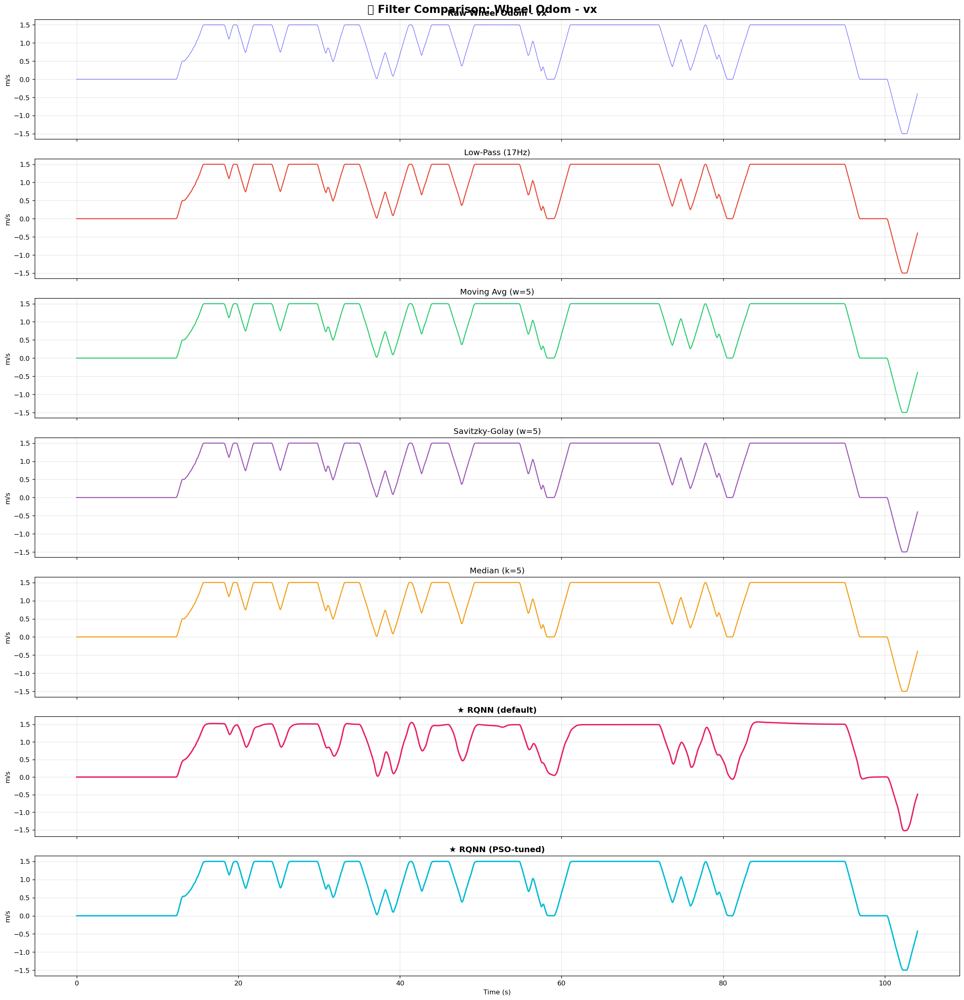

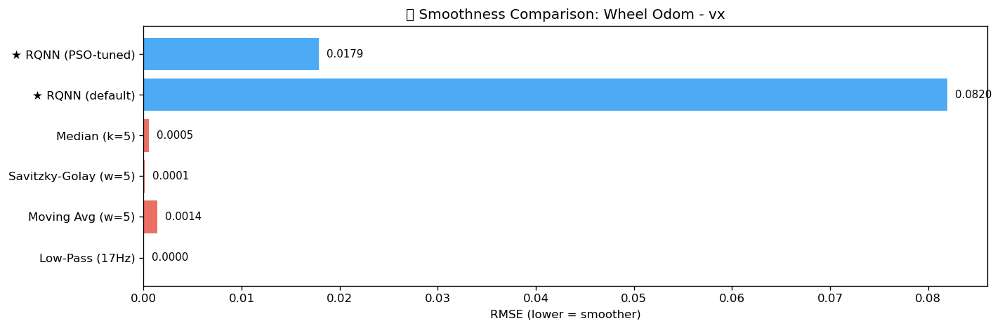


  Processing Wheel Odom - wz (1000 samples, fs=38.6 Hz)
  ✅ Low-Pass (17Hz)
  ✅ Moving Avg (w=5)
  ✅ Savitzky-Golay (w=5)
  ✅ Median (k=5)
  ✅ ★ RQNN (default)
  ✅ ★ RQNN (PSO-tuned)


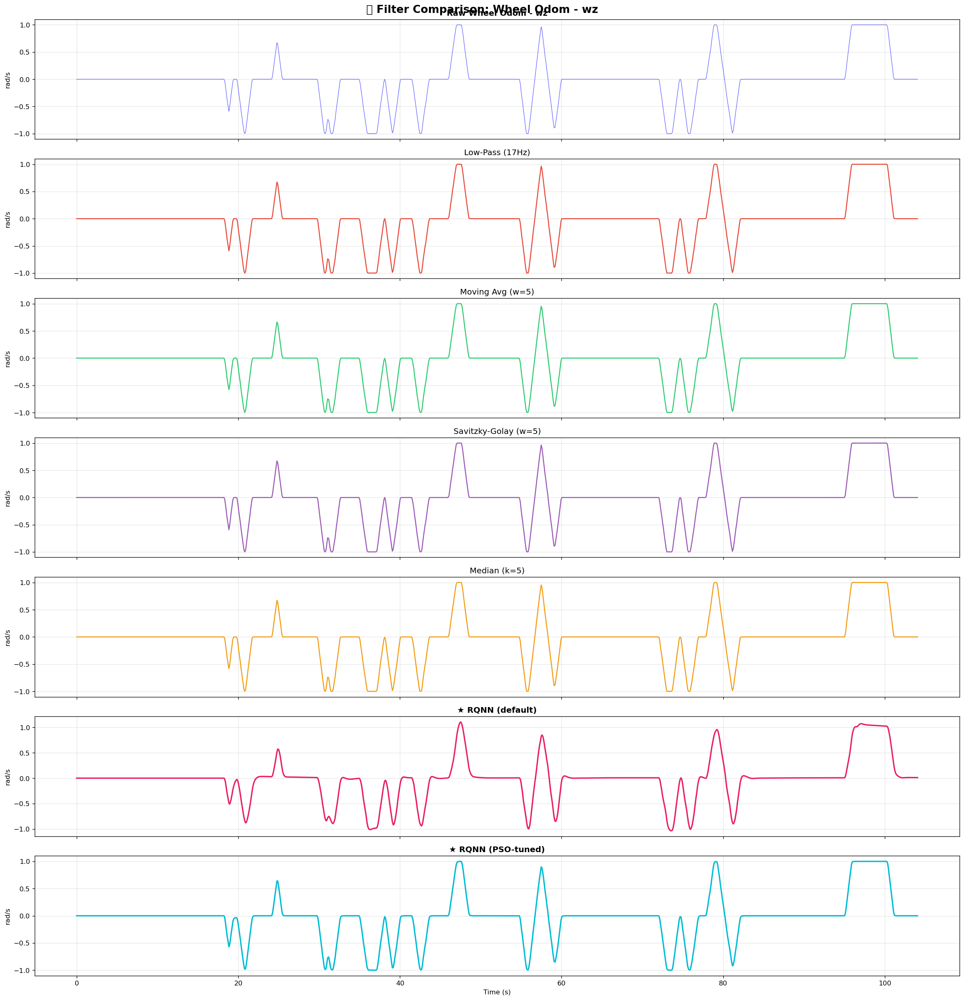

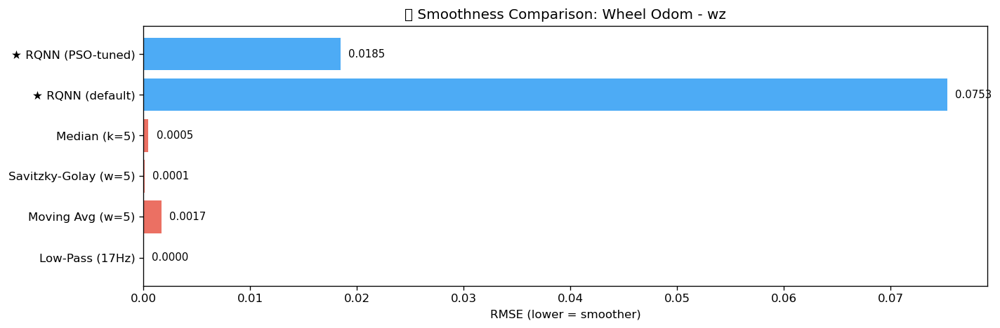


  Processing Visual Odom - vx (1000 samples, fs=14.3 Hz)
  ✅ Low-Pass (6Hz)
  ✅ Moving Avg (w=3)
  ✅ Savitzky-Golay (w=5)
  ✅ Median (k=3)
  ✅ ★ RQNN (default)
  ✅ ★ RQNN (PSO-tuned)


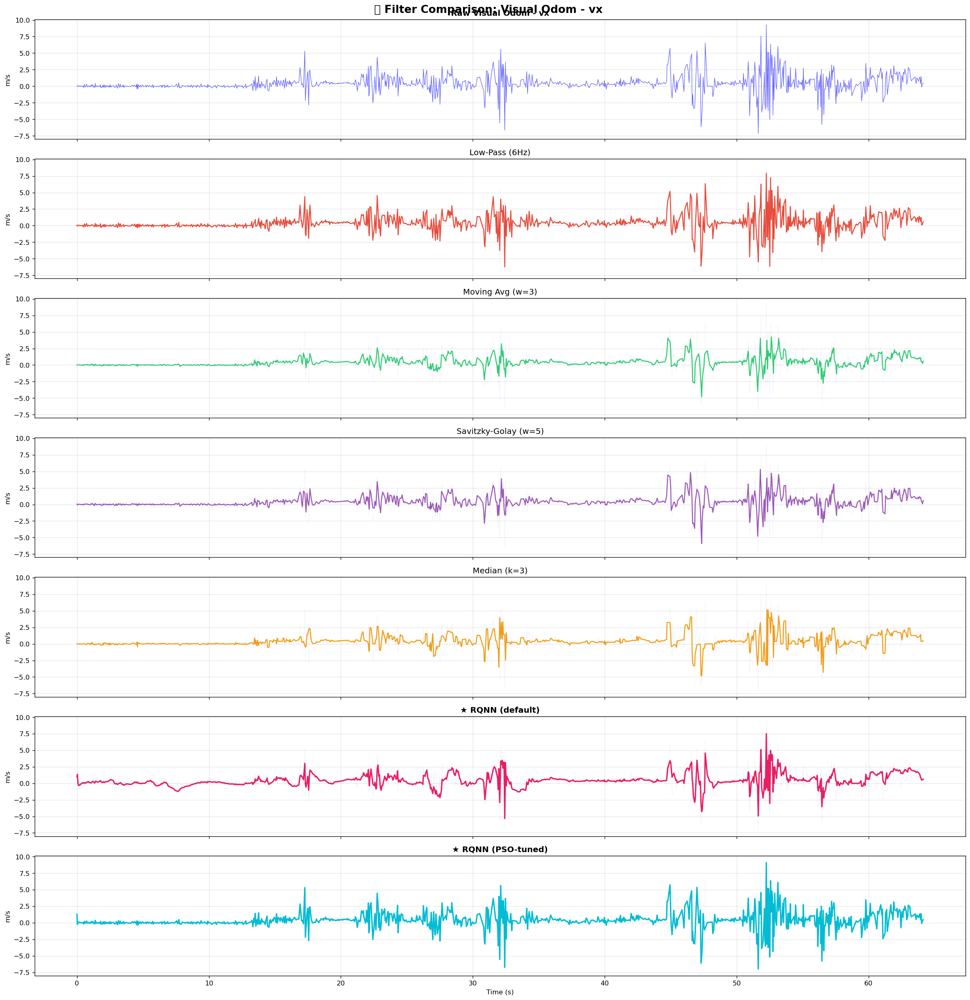

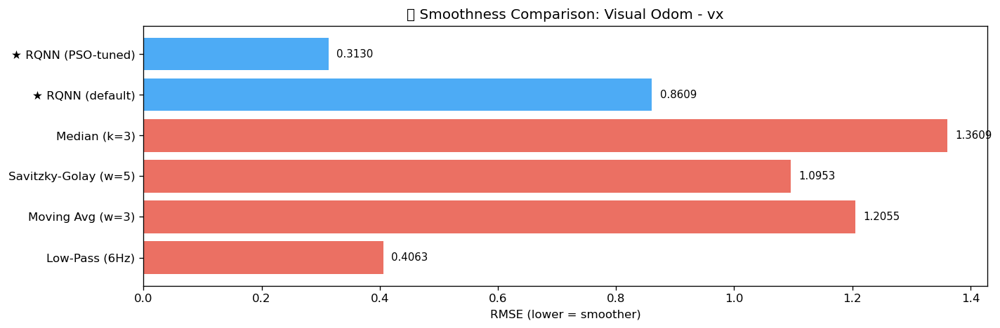


  Processing Visual Odom - wz (1000 samples, fs=14.3 Hz)
  ✅ Low-Pass (6Hz)
  ✅ Moving Avg (w=3)
  ✅ Savitzky-Golay (w=5)
  ✅ Median (k=3)
  ✅ ★ RQNN (default)
  ✅ ★ RQNN (PSO-tuned)


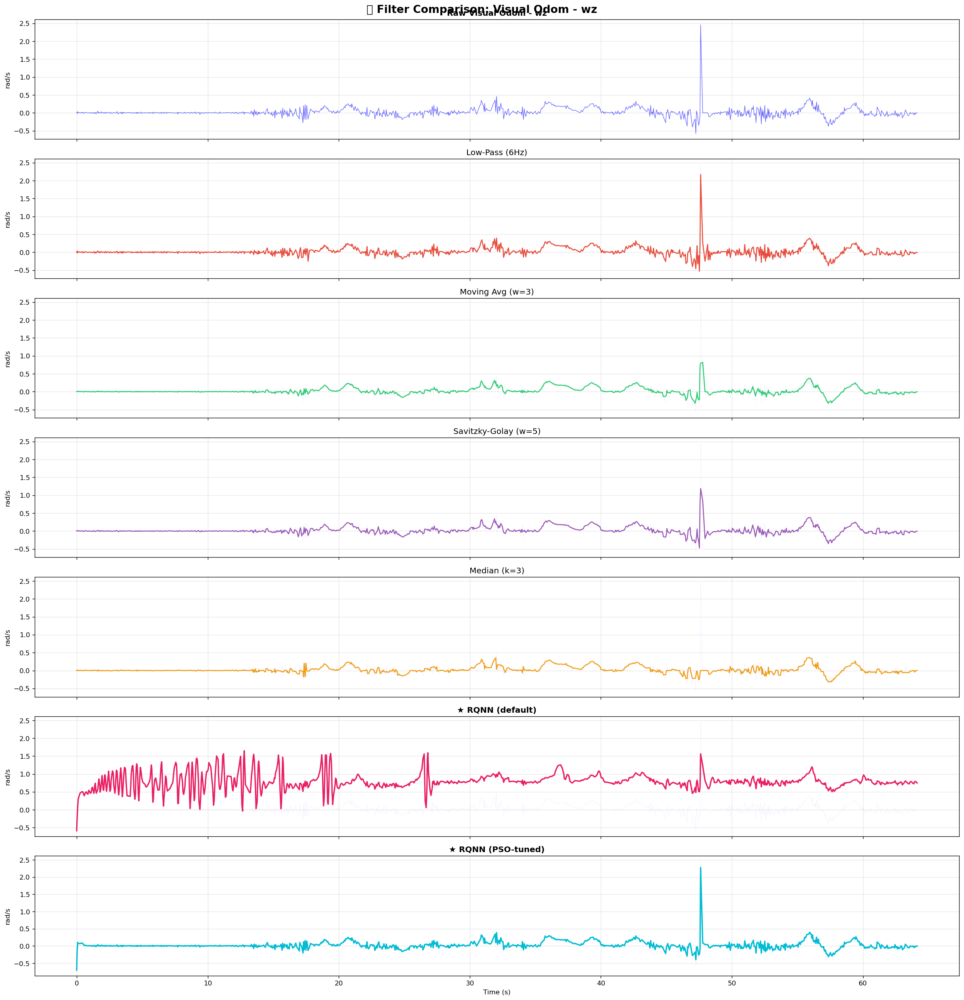

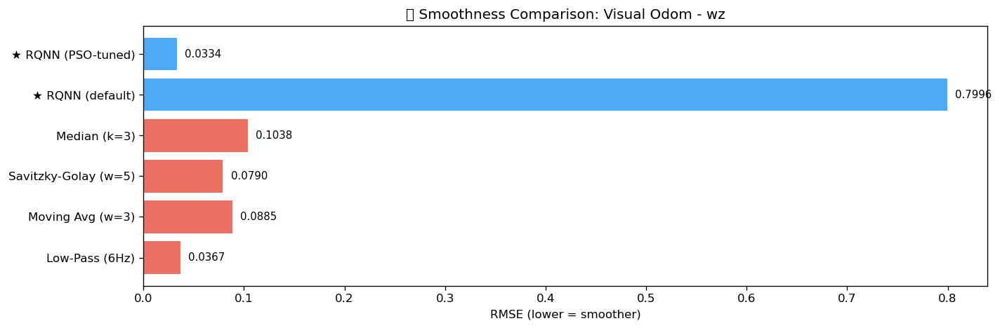


  Processing LiDAR Odom - vx (421 samples, fs=3.9 Hz)
  ✅ Low-Pass (2Hz)
  ✅ Moving Avg (w=3)
  ✅ Savitzky-Golay (w=5)
  ✅ Median (k=3)
  ✅ ★ RQNN (default)
  ✅ ★ RQNN (PSO-tuned)


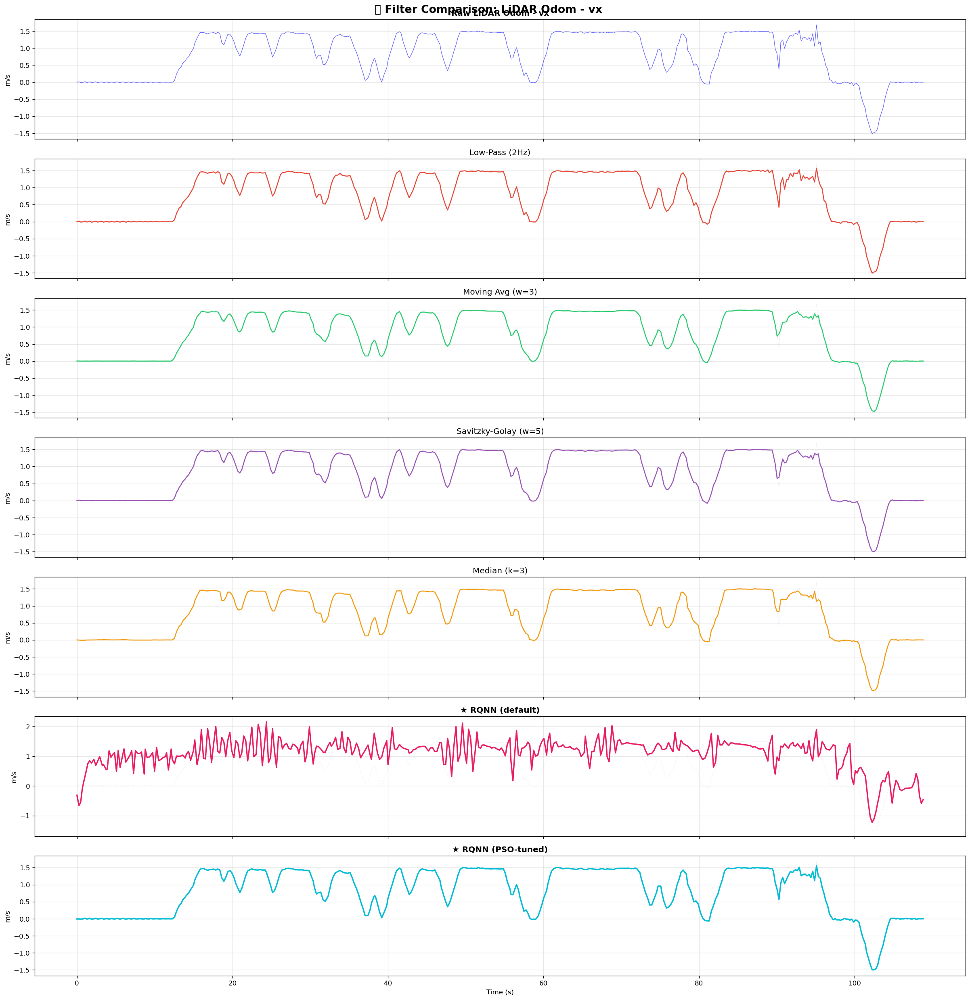

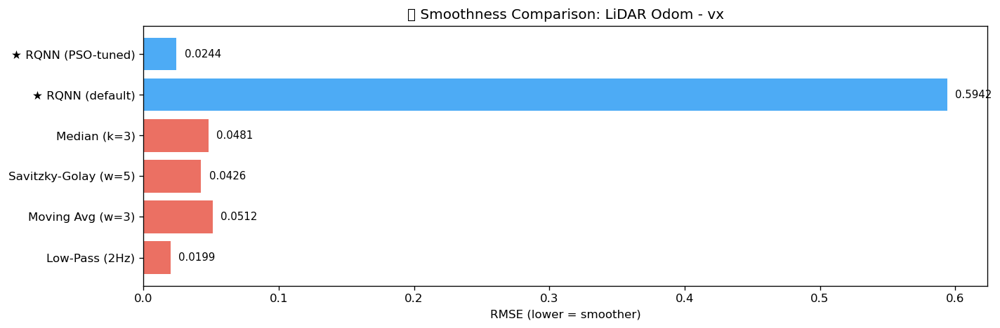


  Processing LiDAR Odom - wz (421 samples, fs=3.9 Hz)
  ✅ Low-Pass (2Hz)
  ✅ Moving Avg (w=3)
  ✅ Savitzky-Golay (w=5)
  ✅ Median (k=3)
  ✅ ★ RQNN (default)
  ✅ ★ RQNN (PSO-tuned)


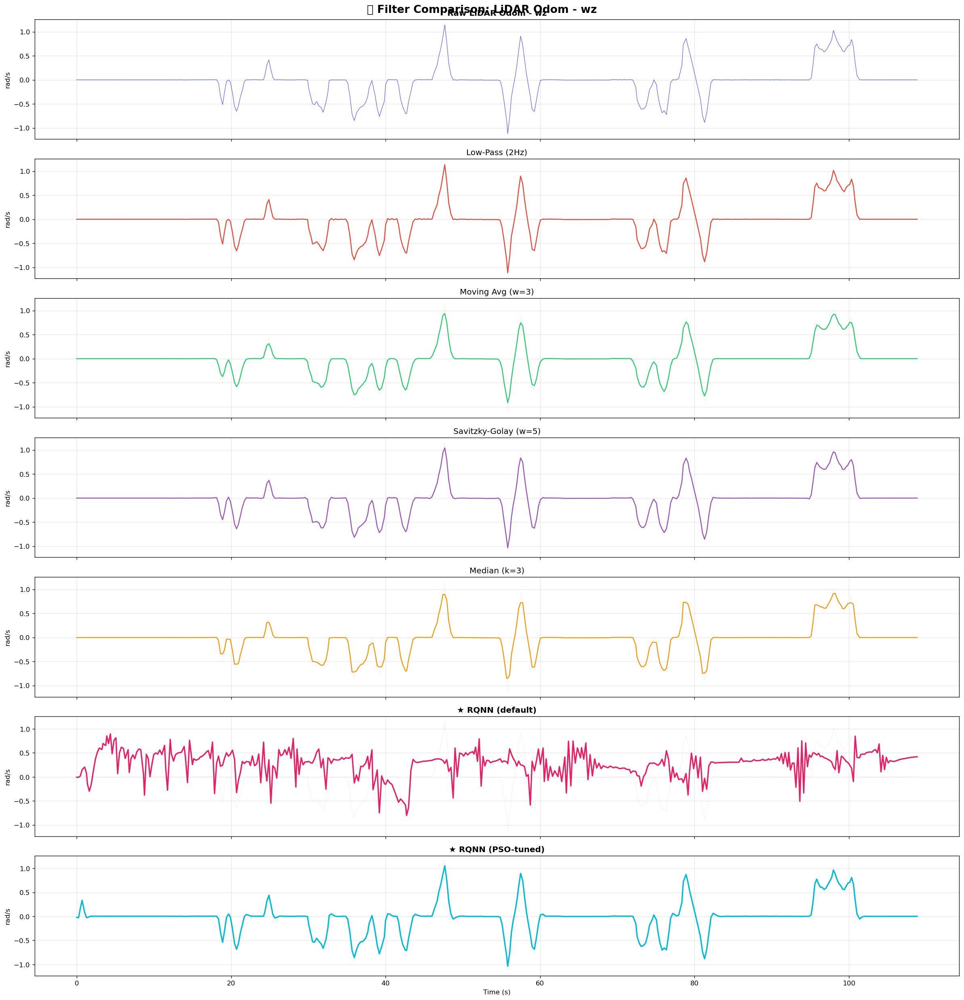

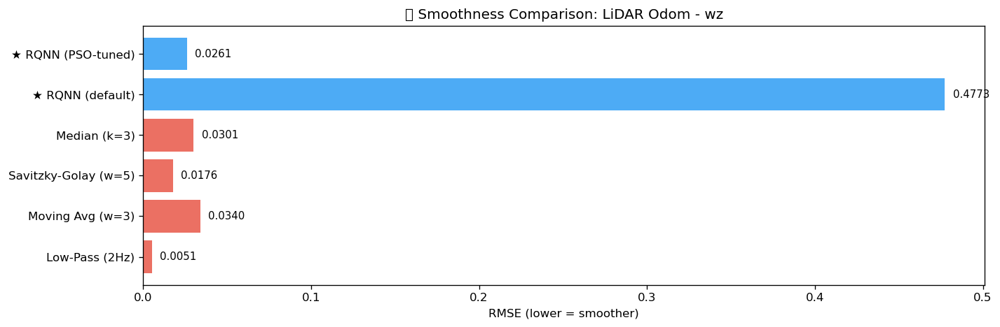

⚠️ EKF Filtered: not enough data, skipping


In [6]:
# ============================================================
# Apply ALL filters to Odometry data
# ============================================================
odom_sources = [
    ('wheel_odom', 'Wheel Odom'),
    ('visual_odom', 'Visual Odom'),
    ('lidar_odom', 'LiDAR Odom'),
    ('ekf', 'EKF Filtered'),
]

odom_channels = [('vx', 'm/s'), ('wz', 'rad/s')]

MAX_SAMPLES_ODOM = 1000  # odometry is lower rate, smaller limit

for key, source_label in odom_sources:
    if key not in dfs or len(dfs[key]) < 10:
        print(f"⚠️ {source_label}: not enough data, skipping")
        continue
    
    df = dfs[key]
    fs = sensor_fs.get(key, 50.0)
    
    for col, unit in odom_channels:
        if col not in df.columns:
            continue
        
        raw_sig = df[col].values.copy()
        t = df['time'].values.copy()
        
        # Subsample for RQNN
        if len(raw_sig) > MAX_SAMPLES_ODOM:
            step = len(raw_sig) // MAX_SAMPLES_ODOM
            sig_sub = raw_sig[::step][:MAX_SAMPLES_ODOM]
            t_sub = t[::step][:MAX_SAMPLES_ODOM]
        else:
            sig_sub = raw_sig
            t_sub = t
        
        print(f"\n{'='*70}")
        print(f"  Processing {source_label} - {col} ({len(sig_sub)} samples, fs={fs:.1f} Hz)")
        print(f"{'='*70}")
        
        results = {}
        
        for apply_fn in [apply_lowpass, apply_moving_avg, apply_savgol, apply_median]:
            try:
                filt_full, name = apply_fn(raw_sig, fs)
                if len(raw_sig) > MAX_SAMPLES_ODOM:
                    filt_sub = filt_full[::step][:MAX_SAMPLES_ODOM]
                else:
                    filt_sub = filt_full
                results[name] = filt_sub
                print(f"  ✅ {name}")
            except Exception as e:
                print(f"  ❌ Error: {e}")
        
        # RQNN default
        try:
            filt_rqnn, name_rqnn = apply_rqnn_default(sig_sub, fs)
            results[name_rqnn] = filt_rqnn
            print(f"  ✅ {name_rqnn}")
        except Exception as e:
            print(f"  ❌ RQNN default: {e}")
        
        # RQNN PSO
        try:
            filt_pso, name_pso = apply_rqnn_pso(sig_sub, fs, n_particles=10, n_iterations=15)
            results[name_pso] = filt_pso
            print(f"  ✅ {name_pso}")
        except Exception as e:
            print(f"  ❌ RQNN PSO: {e}")
        
        # ---- Multi-panel plot ----
        n_filters = len(results)
        fig, axes = plt.subplots(n_filters + 1, 1, figsize=(20, 3 * (n_filters + 1)), sharex=True)
        
        axes[0].plot(t_sub, sig_sub, 'b-', alpha=0.6, linewidth=0.8)
        axes[0].set_title(f'Raw {source_label} - {col}', fontweight='bold')
        axes[0].set_ylabel(unit)
        axes[0].grid(True, alpha=0.3)
        
        colors = ['#e74c3c', '#2ecc71', '#9b59b6', '#f39c12', '#e91e63', '#00bcd4']
        for i, (name, filt) in enumerate(results.items()):
            ax = axes[i + 1]
            ax.plot(t_sub, sig_sub, 'b-', alpha=0.1, linewidth=0.3)
            c = colors[i % len(colors)]
            lw = 2.0 if '★' in name else 1.5
            ax.plot(t_sub, filt, color=c, linewidth=lw)
            ax.set_title(name, fontweight='bold' if '★' in name else 'normal')
            ax.set_ylabel(unit)
            ax.grid(True, alpha=0.3)
        
        axes[-1].set_xlabel('Time (s)')
        plt.suptitle(f'🧠 Filter Comparison: {source_label} - {col}', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()
        
        # ---- RMSE bar chart ----
        rmse_vals = {}
        for name, filt in results.items():
            rmse = np.sqrt(np.mean((sig_sub - filt) ** 2))
            rmse_vals[name] = rmse
        
        fig, ax = plt.subplots(figsize=(12, 4))
        names = list(rmse_vals.keys())
        vals = list(rmse_vals.values())
        bar_colors = ['#e74c3c' if '★' not in n else '#2196f3' for n in names]
        bars = ax.barh(names, vals, color=bar_colors, alpha=0.8)
        ax.set_xlabel('RMSE (lower = smoother)')
        ax.set_title(f'📊 Smoothness Comparison: {source_label} - {col}')
        for bar, val in zip(bars, vals):
            ax.text(bar.get_width() + max(vals) * 0.01, bar.get_y() + bar.get_height()/2,
                    f'{val:.4f}', va='center', fontsize=9)
        plt.tight_layout()
        plt.show()


## 📊 Welch PSD Analysis (Nyquist-Aware)

Power spectral density with proper `nperseg=min(2048, N//2)` for full frequency resolution.


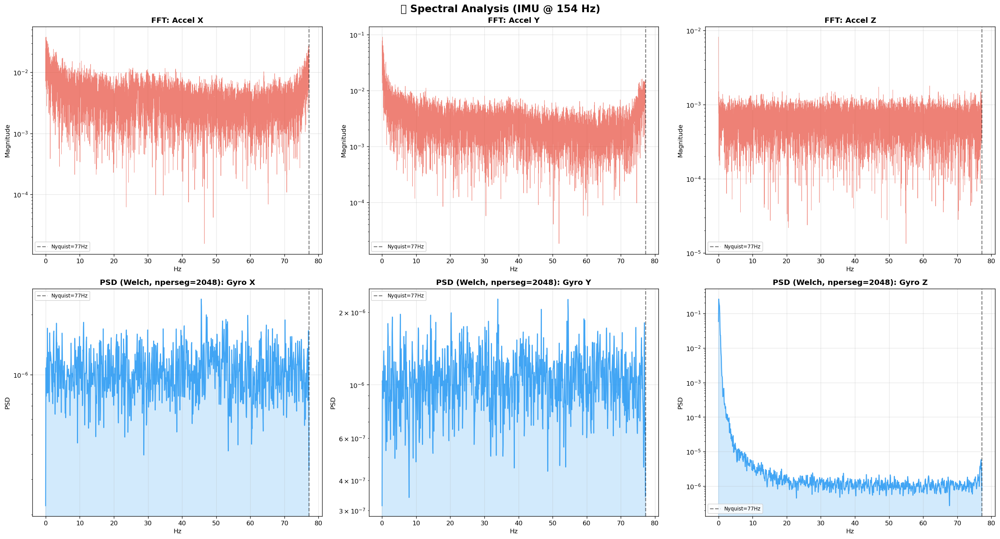

In [7]:
# ============================================================
# Welch PSD with proper frequency resolution
# ============================================================
if 'imu' in dfs:
    imu = dfs['imu']
    fs = sensor_fs['imu']
    
    fig, axes = plt.subplots(2, 3, figsize=(22, 12))
    
    for i, (col, label) in enumerate([('ax','Accel X'), ('ay','Accel Y'), ('az','Accel Z')]):
        d = imu[col].values - np.mean(imu[col].values)
        freqs = rfftfreq(len(d), 1.0/fs)
        mag = np.abs(rfft(d)) * 2.0 / len(d)
        axes[0,i].semilogy(freqs[1:], mag[1:], alpha=0.7, linewidth=0.5, color='#e74c3c')
        axes[0,i].set_title(f'FFT: {label}', fontweight='bold')
        axes[0,i].set_xlabel('Hz')
        axes[0,i].set_ylabel('Magnitude')
        axes[0,i].grid(True, alpha=0.3)
        axes[0,i].axvline(fs/2, color='k', linestyle='--', alpha=0.5, label=f'Nyquist={fs/2:.0f}Hz')
        axes[0,i].legend(fontsize=8)
    
    for i, (col, label) in enumerate([('gx','Gyro X'), ('gy','Gyro Y'), ('gz','Gyro Z')]):
        nperseg = min(2048, len(imu)//2)  # Proper frequency resolution
        f, Pxx = welch(imu[col].values - np.mean(imu[col].values), fs=fs, nperseg=nperseg)
        axes[1,i].semilogy(f, Pxx, color='#2196f3', alpha=0.8)
        axes[1,i].fill_between(f, Pxx, alpha=0.2, color='#2196f3')
        axes[1,i].set_title(f'PSD (Welch, nperseg={nperseg}): {label}', fontweight='bold')
        axes[1,i].set_xlabel('Hz')
        axes[1,i].set_ylabel('PSD')
        axes[1,i].grid(True, alpha=0.3)
        axes[1,i].axvline(fs/2, color='k', linestyle='--', alpha=0.5, label=f'Nyquist={fs/2:.0f}Hz')
        axes[1,i].legend(fontsize=8)
    
    plt.suptitle(f'🔬 Spectral Analysis (IMU @ {fs:.0f} Hz)', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()


## ✅ Summary

This notebook demonstrates:
1. **Nyquist-aware filtering**: All filter windows and cutoffs scaled to actual sensor sampling rate
2. **RQNN filter**: Schrödinger-wave-equation-based quantum neural network filter applied to robot sensor data
3. **PSO-tuned RQNN**: Particle Swarm Optimization for automatic hyperparameter tuning
4. **Side-by-side comparison**: Every filter applied to every sensor channel with RMSE metrics
